In [1]:
import backtrader as bt
import backtrader.analyzers as btanalyzers
import matplotlib
from datetime import datetime
import pandas as pd
import requests
import yfinance as yf # ㅡㅊㅁ

In [2]:

assets = 'nasdaq100'
benchmark = 'NQ=F'
ldf = pd.read_html(requests.get(f'https://www.slickcharts.com/{assets}', headers={'User-agent': 'Mozilla/5.0'}).text)
symbols = [x.replace('.','-') for x in ldf[0]['Symbol'] if isinstance(x, str)]
downloads = yf.download([*symbols, benchmark], '2000-01-01', '2024-07-01', group_by='ticker')
benchmark = downloads[benchmark]['Close']

data = downloads[symbols]

[*********************100%%**********************]  102 of 102 completed


In [3]:
class MaCrossStrategy(bt.Strategy):
    params = (
        ('fast_length', 5),
        ('slow_length', 25)
    )

    def __init__(self):
        print('__init__')
        self.crossovers = []

        for d in self.datas: #adddata에서 추가한 각 주식에 대한 반복문임
            ma_fast = bt.ind.SMA(d, period=self.params.fast_length)
            ma_slow = bt.ind.SMA(d, period=self.params.slow_length)

            self.crossovers.append(bt.ind.CrossOver(ma_fast, ma_slow))

    def next(self): #next를 할때마다 모든 주식에 대해서 처음부터 시작하는게 문제 같은데...
        # 근데 이건 btester랑 다르게 record값이 없어서...
        for i, d in enumerate(self.datas):
            # print(i, d)
            if not self.getposition(d).size:
                if self.crossovers[i] > 0:
                    self.buy(data=d, size=None, )
            elif self.crossovers[i] < 0:
                self.close(data=d)

In [4]:
import time

start = time.time()
cerebro = bt.Cerebro()

df_swp = data.swaplevel(0,1,axis=1)
for symbol in symbols:
    symbol_data = bt.feeds.PandasData(dataname=df_swp.xs(symbol, level=1, axis=1))
    cerebro.adddata(symbol_data)


cerebro.addstrategy(MaCrossStrategy)

cerebro.broker.setcash(100000.0)

cerebro.addsizer(bt.sizers.PercentSizer, percents=10) #매매 사이즈 정하는 곳
cerebro.broker.setcommission(commission=0.0025)

cerebro.addanalyzer(bt.analyzers.PyFolio, _name='PyFolio')

back = cerebro.run()


end = time.time()
print(f"{end - start:.5f} sec")

__init__
0 <backtrader.feeds.pandafeed.PandasData object at 0x103891730>
1 <backtrader.feeds.pandafeed.PandasData object at 0x136281340>
2 <backtrader.feeds.pandafeed.PandasData object at 0x13625d1c0>
3 <backtrader.feeds.pandafeed.PandasData object at 0x13625da60>
4 <backtrader.feeds.pandafeed.PandasData object at 0x131d530a0>
5 <backtrader.feeds.pandafeed.PandasData object at 0x1363944f0>
6 <backtrader.feeds.pandafeed.PandasData object at 0x1360bd850>
7 <backtrader.feeds.pandafeed.PandasData object at 0x1360bdd90>
8 <backtrader.feeds.pandafeed.PandasData object at 0x134f81460>
9 <backtrader.feeds.pandafeed.PandasData object at 0x132591a00>
10 <backtrader.feeds.pandafeed.PandasData object at 0x1321c31f0>
11 <backtrader.feeds.pandafeed.PandasData object at 0x1321c3a90>
12 <backtrader.feeds.pandafeed.PandasData object at 0x1321c3e80>
13 <backtrader.feeds.pandafeed.PandasData object at 0x1362627c0>
14 <backtrader.feeds.pandafeed.PandasData object at 0x136262e50>
15 <backtrader.feeds.panda

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0 <backtrader.feeds.pandafeed.PandasData object at 0x103891730>
1 <backtrader.feeds.pandafeed.PandasData object at 0x136281340>
2 <backtrader.feeds.pandafeed.PandasData object at 0x13625d1c0>
3 <backtrader.feeds.pandafeed.PandasData object at 0x13625da60>
4 <backtrader.feeds.pandafeed.PandasData object at 0x131d530a0>
5 <backtrader.feeds.pandafeed.PandasData object at 0x1363944f0>
6 <backtrader.feeds.pandafeed.PandasData object at 0x1360bd850>
7 <backtrader.feeds.pandafeed.PandasData object at 0x1360bdd90>
8 <backtrader.feeds.pandafeed.PandasData object at 0x134f81460>
9 <backtrader.feeds.pandafeed.PandasData object at 0x132591a00>
10 <backtrader.feeds.pandafeed.PandasData object at 0x1321c31f0>
11 <backtrader.feeds.pandafeed.PandasData object at 0x1321c3a90>
12 <backtrader.feeds.pandafeed.PandasData object at 0x1321c3e80>
13 <backtrader.feeds.pandafeed.PandasData object at 0x1362627c0>
14 <backtrader.feeds.pandafeed.PandasData object at 0x136262e50>
15 <backtrader.feeds.pandafeed.Pand

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0 <backtrader.feeds.pandafeed.PandasData object at 0x103891730>
1 <backtrader.feeds.pandafeed.PandasData object at 0x136281340>
2 <backtrader.feeds.pandafeed.PandasData object at 0x13625d1c0>
3 <backtrader.feeds.pandafeed.PandasData object at 0x13625da60>
4 <backtrader.feeds.pandafeed.PandasData object at 0x131d530a0>
5 <backtrader.feeds.pandafeed.PandasData object at 0x1363944f0>
6 <backtrader.feeds.pandafeed.PandasData object at 0x1360bd850>
7 <backtrader.feeds.pandafeed.PandasData object at 0x1360bdd90>
8 <backtrader.feeds.pandafeed.PandasData object at 0x134f81460>
9 <backtrader.feeds.pandafeed.PandasData object at 0x132591a00>
10 <backtrader.feeds.pandafeed.PandasData object at 0x1321c31f0>
11 <backtrader.feeds.pandafeed.PandasData object at 0x1321c3a90>
12 <backtrader.feeds.pandafeed.PandasData object at 0x1321c3e80>
13 <backtrader.feeds.pandafeed.PandasData object at 0x1362627c0>
14 <backtrader.feeds.pandafeed.PandasData object at 0x136262e50>
15 <backtrader.feeds.pandafeed.Pand

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0 <backtrader.feeds.pandafeed.PandasData object at 0x103891730>
1 <backtrader.feeds.pandafeed.PandasData object at 0x136281340>
2 <backtrader.feeds.pandafeed.PandasData object at 0x13625d1c0>
3 <backtrader.feeds.pandafeed.PandasData object at 0x13625da60>
4 <backtrader.feeds.pandafeed.PandasData object at 0x131d530a0>
5 <backtrader.feeds.pandafeed.PandasData object at 0x1363944f0>
6 <backtrader.feeds.pandafeed.PandasData object at 0x1360bd850>
7 <backtrader.feeds.pandafeed.PandasData object at 0x1360bdd90>
8 <backtrader.feeds.pandafeed.PandasData object at 0x134f81460>
9 <backtrader.feeds.pandafeed.PandasData object at 0x132591a00>
10 <backtrader.feeds.pandafeed.PandasData object at 0x1321c31f0>
11 <backtrader.feeds.pandafeed.PandasData object at 0x1321c3a90>
12 <backtrader.feeds.pandafeed.PandasData object at 0x1321c3e80>
13 <backtrader.feeds.pandafeed.PandasData object at 0x1362627c0>
14 <backtrader.feeds.pandafeed.PandasData object at 0x136262e50>
15 <backtrader.feeds.pandafeed.Pand

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0 <backtrader.feeds.pandafeed.PandasData object at 0x103891730>
1 <backtrader.feeds.pandafeed.PandasData object at 0x136281340>
2 <backtrader.feeds.pandafeed.PandasData object at 0x13625d1c0>
3 <backtrader.feeds.pandafeed.PandasData object at 0x13625da60>
4 <backtrader.feeds.pandafeed.PandasData object at 0x131d530a0>
5 <backtrader.feeds.pandafeed.PandasData object at 0x1363944f0>
6 <backtrader.feeds.pandafeed.PandasData object at 0x1360bd850>
7 <backtrader.feeds.pandafeed.PandasData object at 0x1360bdd90>
8 <backtrader.feeds.pandafeed.PandasData object at 0x134f81460>
9 <backtrader.feeds.pandafeed.PandasData object at 0x132591a00>
10 <backtrader.feeds.pandafeed.PandasData object at 0x1321c31f0>
11 <backtrader.feeds.pandafeed.PandasData object at 0x1321c3a90>
12 <backtrader.feeds.pandafeed.PandasData object at 0x1321c3e80>
13 <backtrader.feeds.pandafeed.PandasData object at 0x1362627c0>
14 <backtrader.feeds.pandafeed.PandasData object at 0x136262e50>
15 <backtrader.feeds.pandafeed.Pand

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0 <backtrader.feeds.pandafeed.PandasData object at 0x103891730>
1 <backtrader.feeds.pandafeed.PandasData object at 0x136281340>
2 <backtrader.feeds.pandafeed.PandasData object at 0x13625d1c0>
3 <backtrader.feeds.pandafeed.PandasData object at 0x13625da60>
4 <backtrader.feeds.pandafeed.PandasData object at 0x131d530a0>
5 <backtrader.feeds.pandafeed.PandasData object at 0x1363944f0>
6 <backtrader.feeds.pandafeed.PandasData object at 0x1360bd850>
7 <backtrader.feeds.pandafeed.PandasData object at 0x1360bdd90>
8 <backtrader.feeds.pandafeed.PandasData object at 0x134f81460>
9 <backtrader.feeds.pandafeed.PandasData object at 0x132591a00>
10 <backtrader.feeds.pandafeed.PandasData object at 0x1321c31f0>
11 <backtrader.feeds.pandafeed.PandasData object at 0x1321c3a90>
12 <backtrader.feeds.pandafeed.PandasData object at 0x1321c3e80>
13 <backtrader.feeds.pandafeed.PandasData object at 0x1362627c0>
14 <backtrader.feeds.pandafeed.PandasData object at 0x136262e50>
15 <backtrader.feeds.pandafeed.Pand

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0 <backtrader.feeds.pandafeed.PandasData object at 0x103891730>
1 <backtrader.feeds.pandafeed.PandasData object at 0x136281340>
2 <backtrader.feeds.pandafeed.PandasData object at 0x13625d1c0>
3 <backtrader.feeds.pandafeed.PandasData object at 0x13625da60>
4 <backtrader.feeds.pandafeed.PandasData object at 0x131d530a0>
5 <backtrader.feeds.pandafeed.PandasData object at 0x1363944f0>
6 <backtrader.feeds.pandafeed.PandasData object at 0x1360bd850>
7 <backtrader.feeds.pandafeed.PandasData object at 0x1360bdd90>
8 <backtrader.feeds.pandafeed.PandasData object at 0x134f81460>
9 <backtrader.feeds.pandafeed.PandasData object at 0x132591a00>
10 <backtrader.feeds.pandafeed.PandasData object at 0x1321c31f0>
11 <backtrader.feeds.pandafeed.PandasData object at 0x1321c3a90>
12 <backtrader.feeds.pandafeed.PandasData object at 0x1321c3e80>
13 <backtrader.feeds.pandafeed.PandasData object at 0x1362627c0>
14 <backtrader.feeds.pandafeed.PandasData object at 0x136262e50>
15 <backtrader.feeds.pandafeed.Pand

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0 <backtrader.feeds.pandafeed.PandasData object at 0x103891730>
1 <backtrader.feeds.pandafeed.PandasData object at 0x136281340>
2 <backtrader.feeds.pandafeed.PandasData object at 0x13625d1c0>
3 <backtrader.feeds.pandafeed.PandasData object at 0x13625da60>
4 <backtrader.feeds.pandafeed.PandasData object at 0x131d530a0>
5 <backtrader.feeds.pandafeed.PandasData object at 0x1363944f0>
6 <backtrader.feeds.pandafeed.PandasData object at 0x1360bd850>
7 <backtrader.feeds.pandafeed.PandasData object at 0x1360bdd90>
8 <backtrader.feeds.pandafeed.PandasData object at 0x134f81460>
9 <backtrader.feeds.pandafeed.PandasData object at 0x132591a00>
10 <backtrader.feeds.pandafeed.PandasData object at 0x1321c31f0>
11 <backtrader.feeds.pandafeed.PandasData object at 0x1321c3a90>
12 <backtrader.feeds.pandafeed.PandasData object at 0x1321c3e80>
13 <backtrader.feeds.pandafeed.PandasData object at 0x1362627c0>
14 <backtrader.feeds.pandafeed.PandasData object at 0x136262e50>
15 <backtrader.feeds.pandafeed.Pand

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0 <backtrader.feeds.pandafeed.PandasData object at 0x103891730>
1 <backtrader.feeds.pandafeed.PandasData object at 0x136281340>
2 <backtrader.feeds.pandafeed.PandasData object at 0x13625d1c0>
3 <backtrader.feeds.pandafeed.PandasData object at 0x13625da60>
4 <backtrader.feeds.pandafeed.PandasData object at 0x131d530a0>
5 <backtrader.feeds.pandafeed.PandasData object at 0x1363944f0>
6 <backtrader.feeds.pandafeed.PandasData object at 0x1360bd850>
7 <backtrader.feeds.pandafeed.PandasData object at 0x1360bdd90>
8 <backtrader.feeds.pandafeed.PandasData object at 0x134f81460>
9 <backtrader.feeds.pandafeed.PandasData object at 0x132591a00>
10 <backtrader.feeds.pandafeed.PandasData object at 0x1321c31f0>
11 <backtrader.feeds.pandafeed.PandasData object at 0x1321c3a90>
12 <backtrader.feeds.pandafeed.PandasData object at 0x1321c3e80>
13 <backtrader.feeds.pandafeed.PandasData object at 0x1362627c0>
14 <backtrader.feeds.pandafeed.PandasData object at 0x136262e50>
15 <backtrader.feeds.pandafeed.Pand

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0 <backtrader.feeds.pandafeed.PandasData object at 0x103891730>
1 <backtrader.feeds.pandafeed.PandasData object at 0x136281340>
2 <backtrader.feeds.pandafeed.PandasData object at 0x13625d1c0>
3 <backtrader.feeds.pandafeed.PandasData object at 0x13625da60>
4 <backtrader.feeds.pandafeed.PandasData object at 0x131d530a0>
5 <backtrader.feeds.pandafeed.PandasData object at 0x1363944f0>
6 <backtrader.feeds.pandafeed.PandasData object at 0x1360bd850>
7 <backtrader.feeds.pandafeed.PandasData object at 0x1360bdd90>
8 <backtrader.feeds.pandafeed.PandasData object at 0x134f81460>
9 <backtrader.feeds.pandafeed.PandasData object at 0x132591a00>
10 <backtrader.feeds.pandafeed.PandasData object at 0x1321c31f0>
11 <backtrader.feeds.pandafeed.PandasData object at 0x1321c3a90>
12 <backtrader.feeds.pandafeed.PandasData object at 0x1321c3e80>
13 <backtrader.feeds.pandafeed.PandasData object at 0x1362627c0>
14 <backtrader.feeds.pandafeed.PandasData object at 0x136262e50>
15 <backtrader.feeds.pandafeed.Pand

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



13 <backtrader.feeds.pandafeed.PandasData object at 0x1362627c0>
14 <backtrader.feeds.pandafeed.PandasData object at 0x136262e50>
15 <backtrader.feeds.pandafeed.PandasData object at 0x136275520>
16 <backtrader.feeds.pandafeed.PandasData object at 0x136275bb0>
17 <backtrader.feeds.pandafeed.PandasData object at 0x13627a220>
18 <backtrader.feeds.pandafeed.PandasData object at 0x13627a910>
19 <backtrader.feeds.pandafeed.PandasData object at 0x13627afa0>
20 <backtrader.feeds.pandafeed.PandasData object at 0x134ff5670>
21 <backtrader.feeds.pandafeed.PandasData object at 0x134ff5d00>
22 <backtrader.feeds.pandafeed.PandasData object at 0x134fe23d0>
23 <backtrader.feeds.pandafeed.PandasData object at 0x134fe2a60>
24 <backtrader.feeds.pandafeed.PandasData object at 0x134fe2e80>
25 <backtrader.feeds.pandafeed.PandasData object at 0x134fe17c0>
26 <backtrader.feeds.pandafeed.PandasData object at 0x134fe1e50>
27 <backtrader.feeds.pandafeed.PandasData object at 0x134ffd520>
28 <backtrader.feeds.pand

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0 <backtrader.feeds.pandafeed.PandasData object at 0x103891730>
1 <backtrader.feeds.pandafeed.PandasData object at 0x136281340>
2 <backtrader.feeds.pandafeed.PandasData object at 0x13625d1c0>
3 <backtrader.feeds.pandafeed.PandasData object at 0x13625da60>
4 <backtrader.feeds.pandafeed.PandasData object at 0x131d530a0>
5 <backtrader.feeds.pandafeed.PandasData object at 0x1363944f0>
6 <backtrader.feeds.pandafeed.PandasData object at 0x1360bd850>
7 <backtrader.feeds.pandafeed.PandasData object at 0x1360bdd90>
8 <backtrader.feeds.pandafeed.PandasData object at 0x134f81460>
9 <backtrader.feeds.pandafeed.PandasData object at 0x132591a00>
10 <backtrader.feeds.pandafeed.PandasData object at 0x1321c31f0>
11 <backtrader.feeds.pandafeed.PandasData object at 0x1321c3a90>
12 <backtrader.feeds.pandafeed.PandasData object at 0x1321c3e80>
13 <backtrader.feeds.pandafeed.PandasData object at 0x1362627c0>
14 <backtrader.feeds.pandafeed.PandasData object at 0x136262e50>
15 <backtrader.feeds.pandafeed.Pand

/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:2343: RuntimeWarning: invalid value encountered in multiply
  lower_bound = _a * scale + loc
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:2344: RuntimeWarning: invalid value encountered in multiply
  upper_bound = _b * scale + loc


                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2000-01-03  2000-01-03
End Period          2024-06-28  2024-06-28
Risk-Free Rate      0.0%        0.0%
Time in Market      0.0%        97.0%

Cumulative Return   0.0%        445.43%
CAGR﹪              0.0%        7.17%

Sharpe              nan         0.4
Sortino             nan         0.57
Sortino/√2          nan         0.4
Omega               nan         nan

Max Drawdown        nan%        -78.99%
Longest DD Days     -           -

Gain/Pain Ratio     nan         0.08
Gain/Pain (1M)      nan         0.43

Payoff Ratio        nan         nan
Profit Factor       nan         1.08
Common Sense Ratio  nan         0.99
CPC Index           nan         nan
Tail Ratio          nan         0.92
Outlier Win Ratio   inf         2.29
Outlier Loss Ratio  nan         2.04

MTD                 0.0%        7.19%
3M                  0.0%        7.69%
6M                  0.0%        16.44%
YTD  

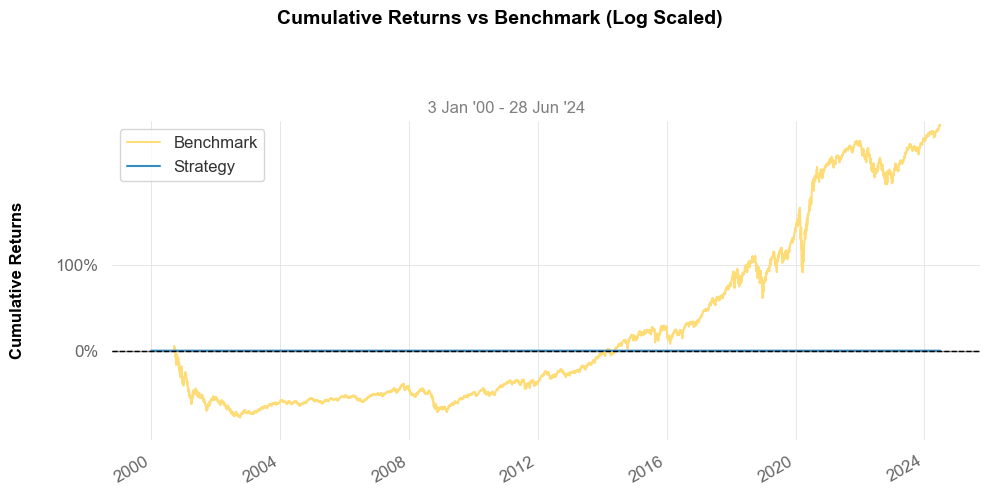

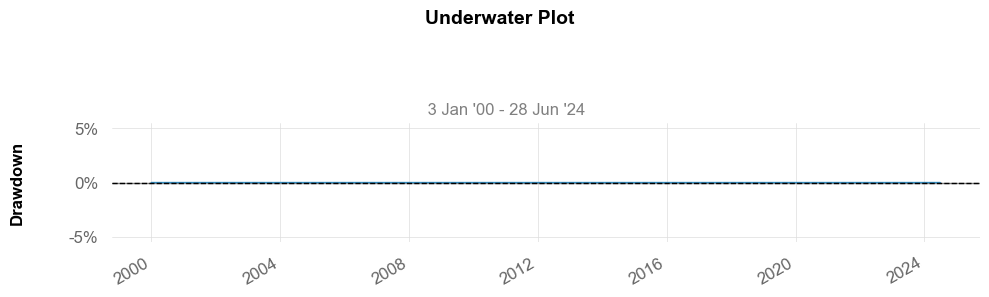

In [5]:
portfolio_stats = back[0].analyzers.getbyname('PyFolio')
returns, positions, transactions, gross_lev = portfolio_stats.get_pf_items()
returns.index = returns.index.tz_convert(None)

import quantstats as qs
qs.reports.metrics(returns, benchmark)
qs.plots.log_returns(returns, benchmark, fontname='sans-serif')
qs.plots.drawdown(returns, figsize=(10,3), fontname='sans-serif')